<a href="https://colab.research.google.com/github/abdazizset/abdazizset.github.io/blob/master/gender_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Conv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import random
import cv2
import os
import glob

# **Let's take a look at the data set**
1. we set up using google drive in colab and then we copy our paths that we store our dataset
2.we downloaded our dataset from https://github.com/balajisrinivas/Gender-Detection as a zip file, it will take more time to download and upload, so be patient
3. Then we upload our dataset in */ content / sample_data*
4. We execute the code to unpack our zip file using the code snippet below

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/sample_data/Gender-Detection-master.zip'

from zipfile import ZipFile
file_name = file_path

with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

FileNotFoundError: ignored

Create Initial Parameters for Our Next Moder

In [3]:
epochs = 100
lr = 1e-3
batch_size = 64
img_dim = (96, 96, 3)

data = []
labels = []


Load Image Files from the Dataset

In [4]:
image_files = [f for f in glob.glob(r"/content/drive/MyDrive/gender_dataset_face" + "/**/*", recursive=True) if not os.path.isdir(f)]
random.shuffle(image_files)

Converting Images to Arrays and Labelling the Catagories

In [6]:
for img in image_files:

  image = cv2.imread(img)

  image = cv2.resize(image, (img_dim[0], img_dim[1]))
  image = img_to_array(image)
  data.append(image)

  label = img.split(os.path.sep)[-2] 
  print(">>>label:", label)
  if label == "woman":
    label = 1
  else:
    label = 0

  labels.append([label]) #>>>labels : [[0], [1], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [0], [0]]
  print(">>>labels :",labels)

>>>label: man
>>>labels : [[0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0]]
>>>label: woman
>>>labels : [[0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1]]
>>>label: woman
>>>labels : [[0], [1], 

Pre-Processing

In [7]:
data = np.array(data, dtype="float")/255.0
labels = np.array(labels)

Split Dataset for Training and Validation

In [8]:
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.2, random_state=42)

trainY = to_categorical(trainY, num_classes=2)
print(">>>trainY", trainY[0])

>>>trainY [0. 1.]


In [10]:
testY = to_categorical(testY, num_classes=2)

Augmenting Dataset

In [11]:
aug = ImageDataGenerator(rotation_range=25, width_shift_range=0.1,
                         height_shift_range=0.1, shear_range=0.2,
                         zoom_range=0.2, horizontal_flip=True, fill_mode="nearest")

Define Model

In [12]:
def build(width, height, depth, classes):
  model = Sequential()
  inputShape = (height, width, depth)
  chanDim = -1

  if K.image_data_format() == "channels_first": #Return a String, Either 'channels_first' or 'channel_last'
    inputShape = (depth, height, width)
    chanDim = 1
  #The Axis that should be Normalized, after a Conv2D layer with data_format="channel_first",
  #set_axis=1 in BatchNormalization
  model.add(Conv2D(32, (3, 3), padding="same", input_shape=inputShape))
  model.add(Activation("relu"))
  model.add(BatchNormalization(axis=chanDim))
  model.add(MaxPooling2D(pool_size=(3, 3)))
  model.add(Dropout(0.25))

  model.add(Conv2D(64, (3, 3), padding="same")) #I try using 256, the true one is 64
  model.add(Activation("relu"))
  model.add(BatchNormalization(axis=chanDim))

  model.add(Conv2D(64, (3,3), padding="same"))
  model.add(Activation("relu"))
  model.add(BatchNormalization(axis=chanDim))
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.25))

  model.add(Conv2D(128, (3,3), padding="same"))
  model.add(Activation("relu"))
  model.add(BatchNormalization(axis=chanDim))

  model.add(Conv2D(128, (3,3), padding="same"))
  model.add(Activation("relu"))
  model.add(BatchNormalization(axis=chanDim))
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.25))

  model.add(Flatten())
  model.add(Dense(1024))
  model.add(Activation("relu"))
  model.add(BatchNormalization())
  model.add(Dropout(0.5))

  model.add(Dense(classes))
  model.add(Activation("sigmoid"))

  return model

Build Model

In [13]:
model = build(width=img_dim[0], height=img_dim[1], depth=img_dim[2], classes=2)

Compile the Model

In [14]:
opt = Adam(lr=lr, decay=lr/epochs)
model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

Train the Model

In [15]:
history = model.fit_generator(aug.flow(trainX, trainY, batch_size=batch_size),
                              validation_data=(testX, testY),
                              steps_per_epoch=len(trainX) // batch_size,
                              epochs=epochs, verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
29/29 [==============================] - 38s 173ms/step - loss: 0.9686 - accuracy: 0.6648 - val_loss: 0.7639 - val_accuracy: 0.4927
Epoch 2/100
29/29 [==============================] - 4s 143ms/step - loss: 0.5112 - accuracy: 0.8009 - val_loss: 0.7744 - val_accuracy: 0.4969
Epoch 3/100
29/29 [==============================] - 4s 144ms/step - loss: 0.4210 - accuracy: 0.8303 - val_loss: 0.6612 - val_accuracy: 0.5720
Epoch 4/100
29/29 [==============================] - 4s 143ms/step - loss: 0.3583 - accuracy: 0.8568 - val_loss: 0.6264 - val_accuracy: 0.7328
Epoch 5/100
29/29 [==============================] - 4s 147ms/step - loss: 0.3125 - accuracy: 0.8745 - val_loss: 0.8413 - val_accuracy: 0.6138
Epoch 6/100
29/29 [==============================] - 4s 146ms/step - loss: 0.2902 - accuracy: 0.8942 - val_loss: 0.6569 - val_accuracy: 0.6952
Epoch 7/100
29/29 [==============================] - 4s 144ms/step - loss: 0.2790 - accuracy: 0.8933 - val_loss: 1.5154 - val_accuracy: 0.507

Save the Model to Disk

In [16]:
model.save('gender_detection.model')

INFO:tensorflow:Assets written to: gender_detection.model/assets


Plot Training/Validation Loss/Accuracy

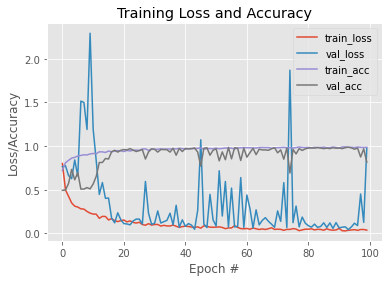

In [23]:
plt.style.use("ggplot")
plt.figure()
N = epochs
plt.plot(np.arange(0,N), history.history["loss"], label="train_loss")
plt.plot(np.arange(0,N), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0,N), history.history["accuracy"], label="train_acc")
plt.plot(np.arange(0,N), history.history["val_accuracy"], label="val_acc")

plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="upper right")

Save Plot to Disk

In [24]:
plt.savefig('plot.png')

<Figure size 432x288 with 0 Axes>

### **Detection Gender Webcam**

In [28]:
!pip3 install cvlib

     |████████████████████████████████| 10.1MB 18.8MB/s 
  Created wheel for cvlib: filename=cvlib-0.2.6-cp37-none-any.whl size=10044621 sha256=caa28600d634536f5069bfad5c057d612cc3f81505d2da344f7acadcec975e1b
  Stored in directory: /root/.cache/pip/wheels/5e/a4/99/8dfcae03a6f93bb4084650d0b642ef5a472429928fb95ffd01
  Created wheel for progressbar: filename=progressbar-2.5-cp37-none-any.whl size=12076 sha256=eb245f88b27fc4205c90f12d4175724c20736782fb0bfa2a30fc28a942470d9a
  Stored in directory: /root/.cache/pip/wheels/c0/e9/6b/ea01090205e285175842339aa3b491adeb4015206cda272ff0
Successfully built cvlib progressbar


In [29]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import  load_model
import numpy as np
import cv2
import os
import cvlib as cv

Load Model

In [30]:
model = load_model('/content/gender_detection.model')

Open Webcam

In [31]:
webcam = cv2.VideoCapture(0)

classes = ['man', 'woman']

Loop through frames

In [34]:
while webcam.isOpened():

  #Read frame from webcam
  status, frame = webcam.read()

  #Apply face detection
  face, confidence = cv.detect_face(frame)

  #Loop through detected faces
  for idx, f in enumerate(face):

    #Get corner points of face rectangle
    (startX, startY) = f[0], f[1]
    (endX, endY) = f[2], f[3]

    #Draw rectangle over face
    cv2.rectangle(frame, (startX, startY), (endX, endY), (0, 255, 0), 2)

    #Crop the detected face region
    face_crop = np.copy(frame[startY:endY, startX:endX])

    if (face_crop.shape[0]) < 10 or (face_crop.shape[1]) < 10:
      continue
    
    #Preprocessing for gender detection model
    face_crop = cv2.resize(face_crop, (96, 96))
    face_crop = face_crop.astype("float")/255.0
    face_crop = img_to_array(face_crop)
    face_crop = np.expand_dims(face_crop, axis=0)

    #Apply gender detection on face
    conf = model.predict(face_corp)[0]

    #Get label with max accuracy
    idx = np.argmax(conf)
    label = classes[idx]

    label = "{}: {:.2f}".format(label, conf[idx]*100)

    Y = startY - 10 if startY - 10 > 10 else startY + 10

    #Write label and confidence above face rectangle
    cv2.putText(frame, label, (startX, Y), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 0.7, (0, 255, 0), 2)

  #Display Output
  cv2.imshow("gender detection", frame)

  #Press "Q" to stop
  if cv2.waitKey(1) & 0xFF == ord('q'):
    break
  
# release resources
webcam.release()
cv2.destroyAllWindows()
